# Training Results Validation

In [1]:
import pandas as pd
import numpy as np
import os
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms

## Helper functions

In [2]:
class Config():
    results = "./results.pkl"
    images = "./kinsame-assignment/"

In [3]:
def imshow(img, text=None,should_save=False):
    if torch.is_tensor(img):
      img = img.numpy()
      img = np.transpose(img, (1, 2, 0))
    plt.axis("off")
    if text:
        plt.text(75, 8, text, style='italic',fontweight='bold',
            bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})
    plt.imshow(img)
    plt.show()    

def show_plot(iteration,loss):
    plt.plot(iteration,loss)
    plt.show()

## Reading the test split results.

In [4]:
data_df = pd.read_pickle(Config.results)
data_df.sort_values(by=['dissimilarity'], inplace=True)
data_df.reset_index(drop=True, inplace=True)

In [5]:
data_df.head()

,person1_id,person2_id,img1_path,img2_path,label,dissimilarity
0,F0035_3,F0035_3,images/3500003_36200000.jpg,images/3500003_36200000.jpg,0.0,0.0
1,F0857_1,F0857_1,images/85700001_905200000.jpg,images/85700001_905200000.jpg,0.0,0.0
2,F0773_3,F0773_3,images/77300003_816700003.jpg,images/77300003_816700003.jpg,0.0,0.0
3,F0015_4,F0015_4,images/1500004_15900002.jpg,images/1500004_15900002.jpg,0.0,0.0
4,F0653_4,F0653_4,images/65300004_686500000.jpg,images/65300004_686500000.jpg,0.0,0.0


## Get the data

In [6]:
!gdown  1ScnG-T-VWkzSkwT-KSPcVeWUBq_kD_tK
!unzip kinsame-assignment.zip -d kinsame-assignment

Downloading...
From: https://drive.google.com/uc?id=1ScnG-T-VWkzSkwT-KSPcVeWUBq_kD_tK
To: /Users/yudkin/dev/Kinsame/kinsame-assignment.zip
100%|██████████████████████████████████████| 44.4M/44.4M [00:01<00:00, 27.5MB/s]
Archive:  kinsame-assignment.zip
replace kinsame-assignment/images/85200002_900100003.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


# Recall Precision Curve

Typically, we need to select a threshold value and evaluate the performance of the model based on this threshold. Often, we choose the working point to be the intersection point between the recall and precision curves. For example, a threshold of ±1 may result in 0.8 recall and 0.8 precision.

Any future improvements to the model should be evaluated against these curves. A higher intersection point between the curves indicates a better result.

(0.0, 1.0)

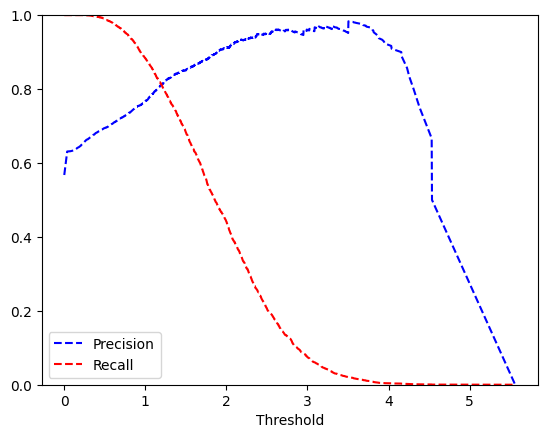

In [7]:
precision, recall, threshold = precision_recall_curve(data_df.label.values,
                                                      data_df.dissimilarity.values)

plt.plot(threshold, precision[:-1], 'b--', label='Precision')
plt.plot(threshold, recall[:-1], 'r--', label='Recall')
plt.xlabel('Threshold')
plt.legend(loc='lower left')
plt.ylim([0,1])

## GT and Pred distribution
Destribution of the scores

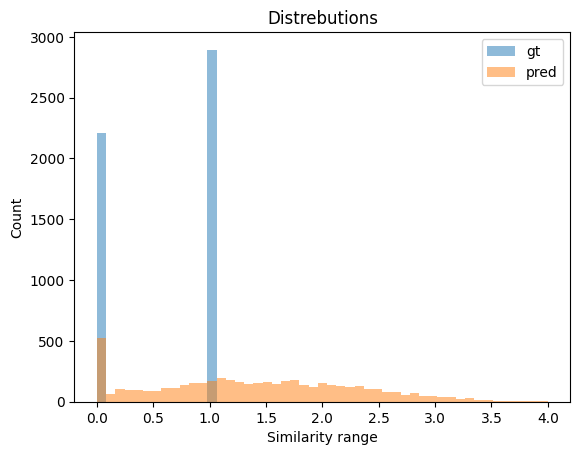

In [8]:
bins = np.linspace(0, 4, 50)
plt.hist(data_df.label.values, bins, alpha=0.5, label='gt')
plt.hist(data_df.dissimilarity.values, bins, alpha=0.5, label='pred')
plt.legend(loc='upper right')
plt.title("Distrebutions")
plt.xlabel("Similarity range")
plt.ylabel("Count")

plt.show()

### Similar images issue

In [9]:
same_image = sum(data_df.img1_path == data_df.img2_path) / sum(data_df.person1_id == data_df.person2_id)
print(round(same_image, 3))

0.233


**1. There are 23% of similar faces that is the same image pairs, it's too match. There should dfferent augmentations used on those images pairs, meaning each imgage should be differently augmented then it's pair.**

## Similar Cases - FN

0.0557570262919311


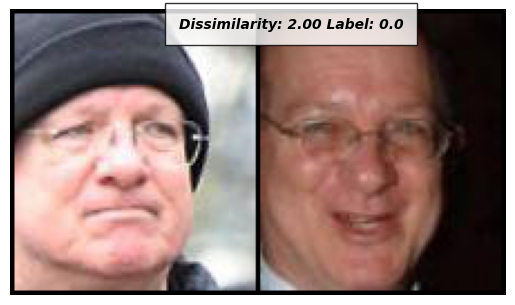

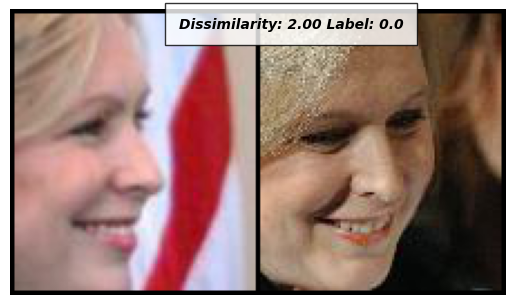

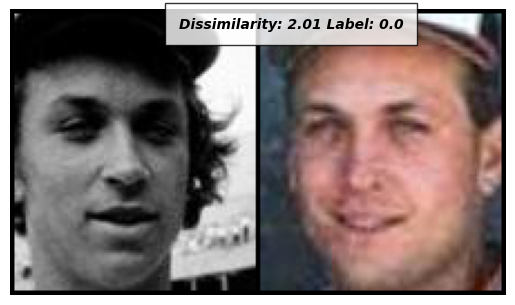

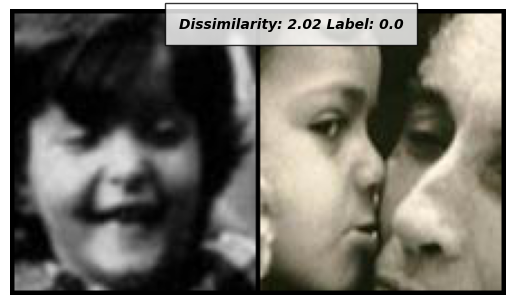

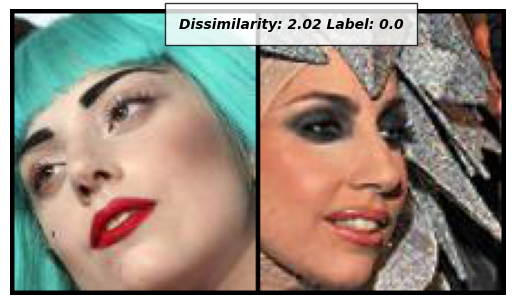

...

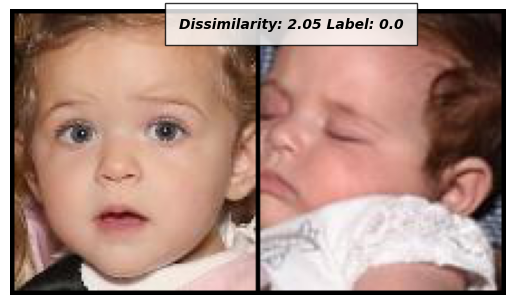

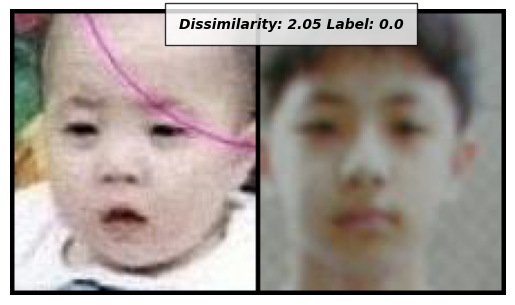

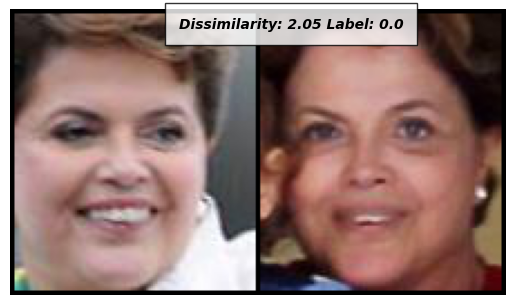

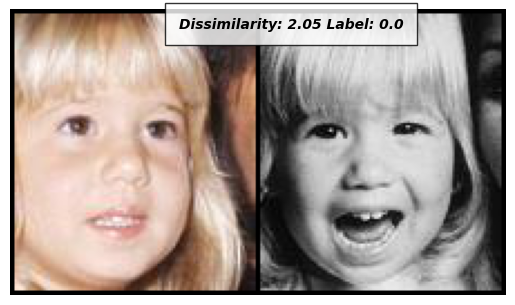

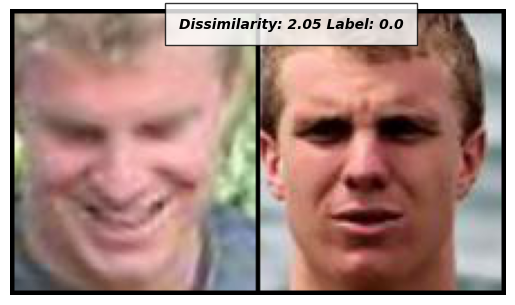

In [10]:
df = data_df[(data_df.person1_id == data_df.person2_id) & (data_df.dissimilarity > 2.0)]
print(len(df)/ sum(data_df.person1_id == data_df.person2_id))

for _, row in df.head(20).iterrows():
    img0 = torchvision.io.read_image(os.path.join(Config.images, row.img1_path))
    img1 = torchvision.io.read_image(os.path.join(Config.images,row.img2_path))

    concatenated = torch.cat((img0[None], img1[None]),0)
    text = 'Dissimilarity: {:.2f} Label: {}'.format(row.dissimilarity, row.label)
    imshow(torchvision.utils.make_grid(concatenated), text)

 **2. Can be seen that there is a issue with head accessories hats, glasses, etc. Those cases should be augmented.**

**3. Some issues because one of the images older/younger then other. The dataset should be enriched with age id data, can be done by some external network, and then teach used network to estimate aging ( liketeacher student), this will help with estimating the same not same problem.**

**4. Yaw Pitch Roll due to difference in the angles it can be see there many issues because of the  different angles, this again can be estimated by some exteranal network for the whole dataset and then used with corrent network as teacher studend. In addition this data can be used for angle augmentation of the data. there are works that can change viewing angle of the image from single example.**

**5. I would remove too blurry images from the training dataset.**

**6. I not used augmentations at all during my training, usage of simple augmenttions surly will improve the results.**

## Similar Cases - TP

0.42883046237534


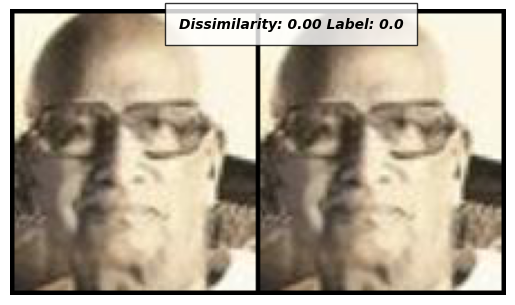

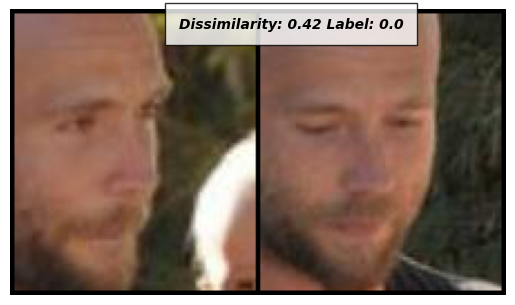

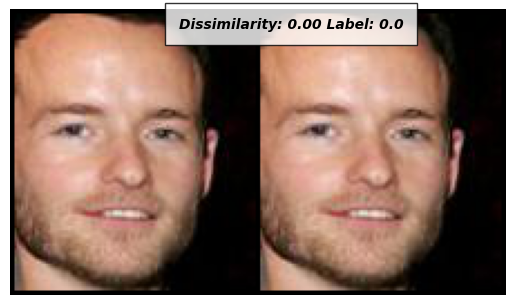

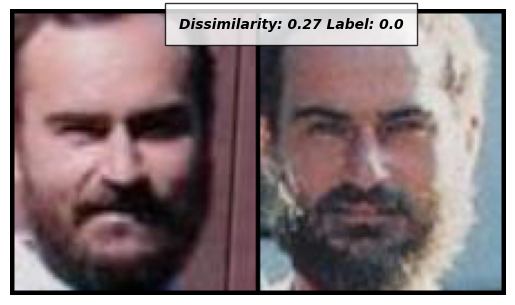

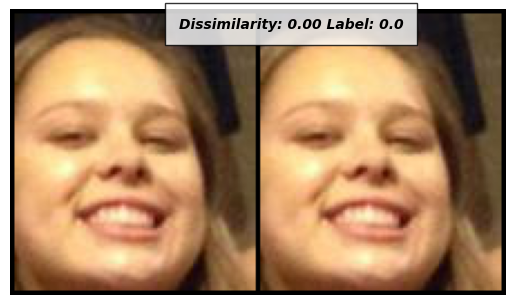

...

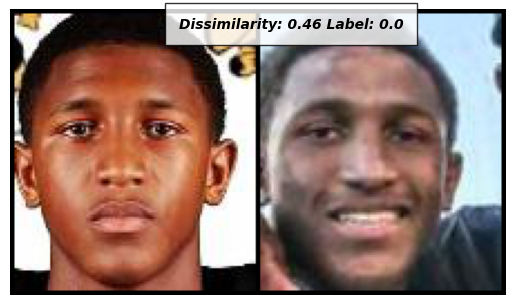

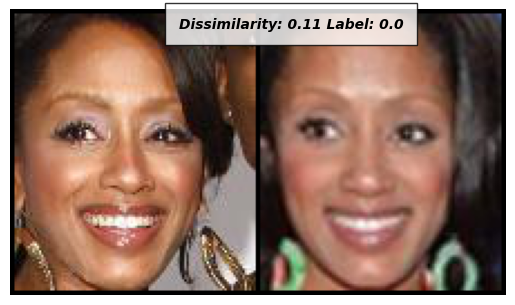

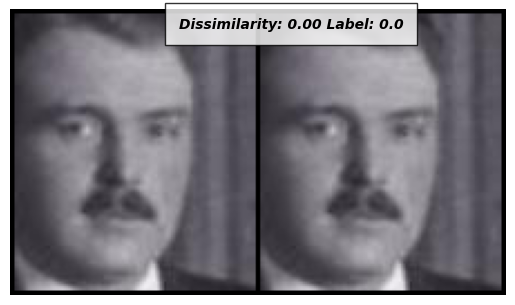

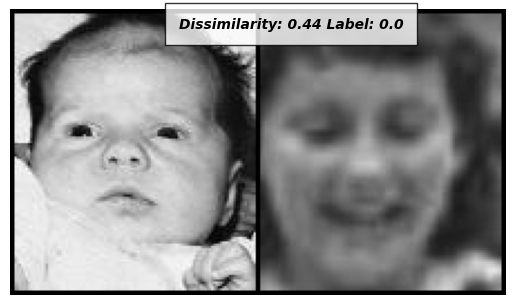

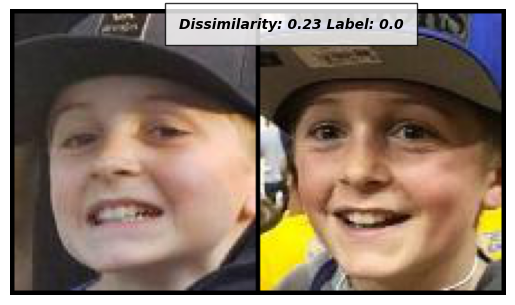

In [11]:
df = data_df[(data_df.person1_id == data_df.person2_id) & (data_df.dissimilarity < 0.5)]
print(len(df)/ sum(data_df.person1_id == data_df.person2_id))

for _, row in df.sample(20).iterrows():
    img0 = torchvision.io.read_image(os.path.join(Config.images, row.img1_path))
    img1 = torchvision.io.read_image(os.path.join(Config.images,row.img2_path))

    concatenated = torch.cat((img0[None], img1[None]),0)
    text = 'Dissimilarity: {:.2f} Label: {}'.format(row.dissimilarity, row.label)
    imshow(torchvision.utils.make_grid(concatenated), text)

## Dissimilar Cases - TP

0.5784224841341795


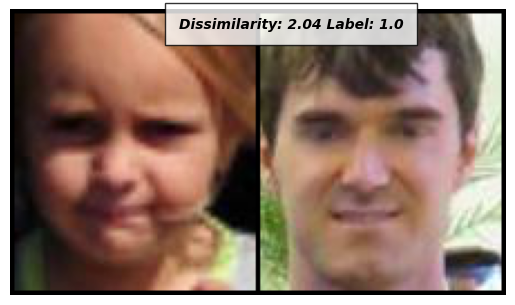

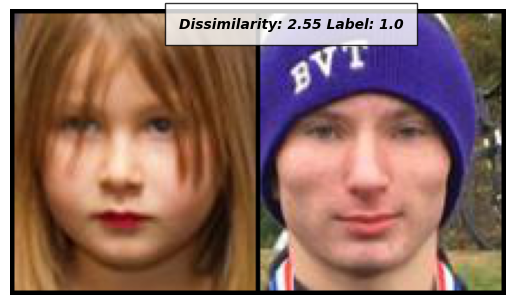

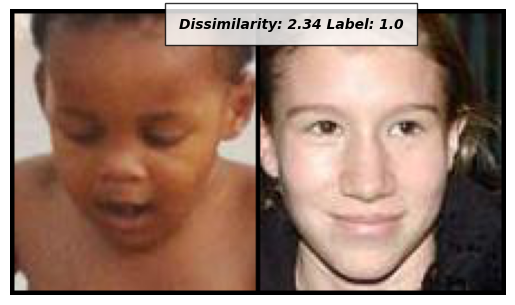

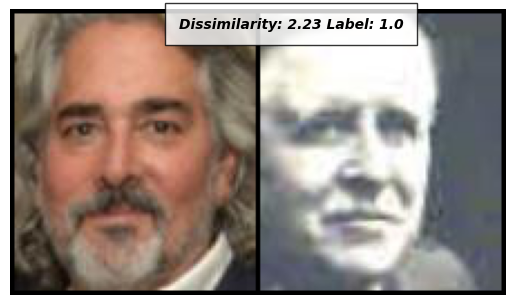

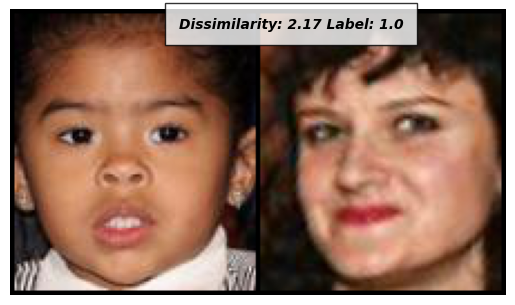

...

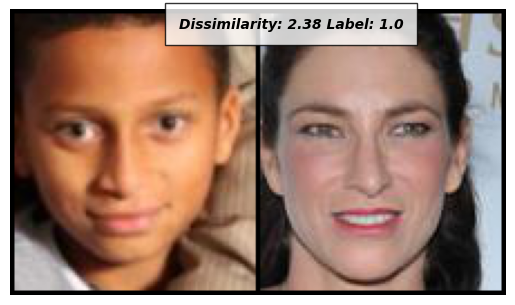

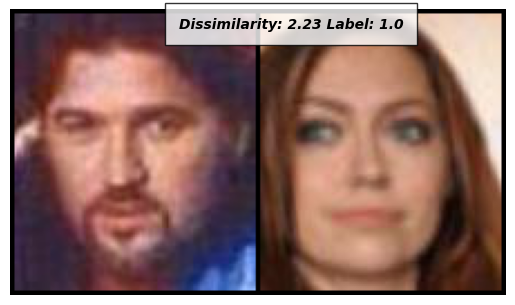

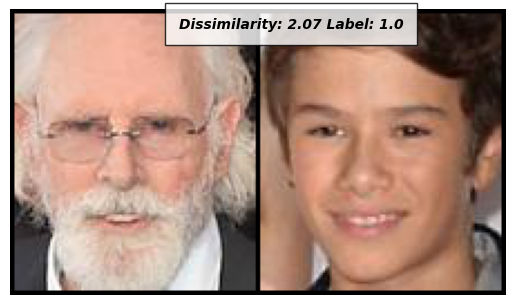

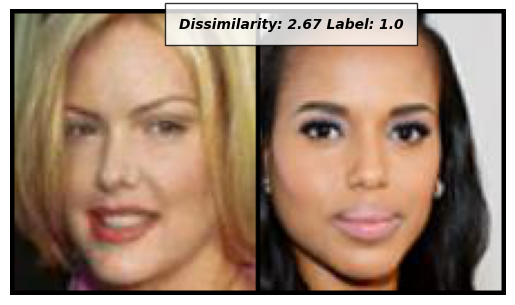

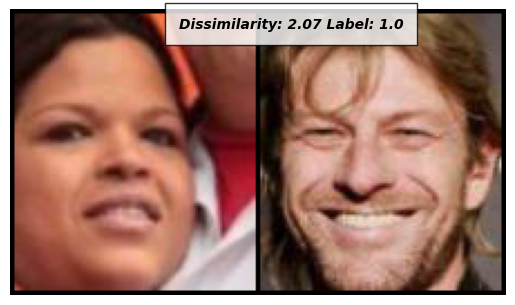

In [12]:
df = data_df[(data_df.person1_id != data_df.person2_id) & (data_df.dissimilarity > 2.0)]
print(len(df)/ sum(data_df.person1_id == data_df.person2_id))

for _, row in df.sample(20).iterrows():
    img0 = torchvision.io.read_image(os.path.join(Config.images, row.img1_path))
    img1 = torchvision.io.read_image(os.path.join(Config.images,row.img2_path))

    concatenated = torch.cat((img0[None], img1[None]),0)
    text = 'Dissimilarity: {:.2f} Label: {}'.format(row.dissimilarity, row.label)
    imshow(torchvision.utils.make_grid(concatenated), text)

**Really different examples**

## Dissimilar Cases - FN

0.013599274705349048


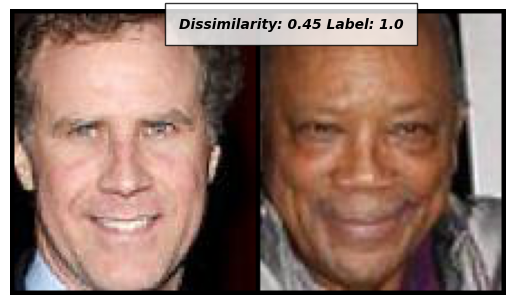

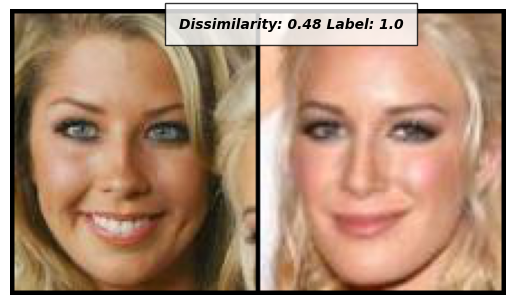

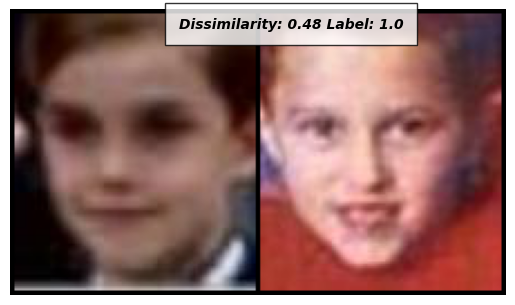

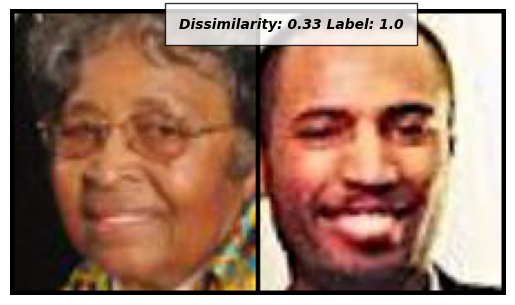

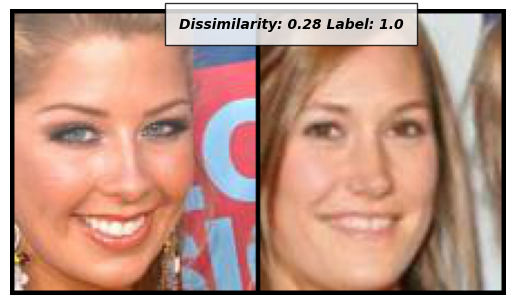

...

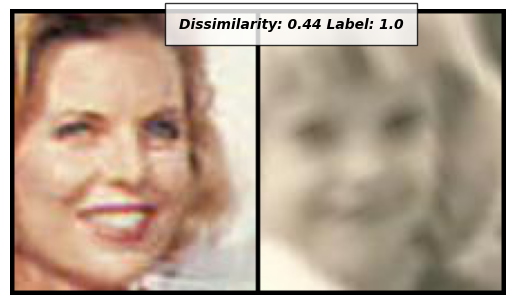

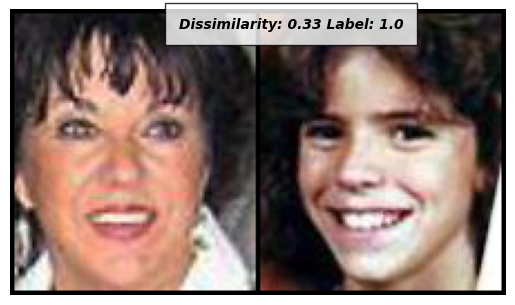

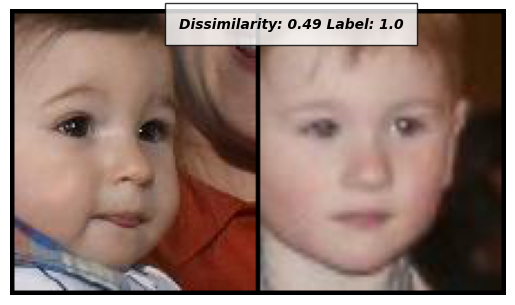

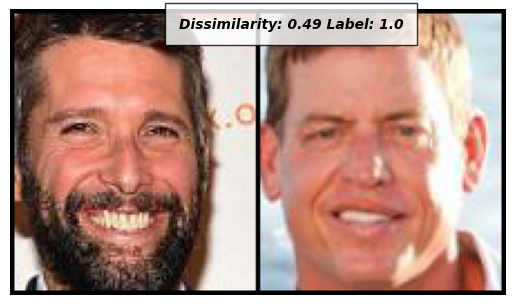

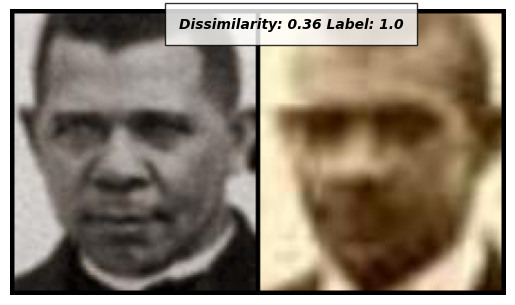

In [13]:
df = data_df[(data_df.person1_id != data_df.person2_id) & (data_df.dissimilarity < 0.5)]
print(len(df)/ sum(data_df.person1_id == data_df.person2_id))

for _, row in df.sample(20).iterrows():
    img0 = torchvision.io.read_image(os.path.join(Config.images, row.img1_path))
    img1 = torchvision.io.read_image(os.path.join(Config.images,row.img2_path))

    concatenated = torch.cat((img0[None], img1[None]),0)
    text = 'Dissimilarity: {:.2f} Label: {}'.format(row.dissimilarity, row.label)
    imshow(torchvision.utils.make_grid(concatenated), text)

**7. Thinks that blond people are similar. The dataset should be enhanced with data of hair colors to know what happenning with training data in tis area. Probably not enough blond people in the training split. After you know the color of person in the image you can construct new pairs of different persons with blond hair as negatives**

**8. Probelems with facial hair man with facial hair are misteken with man cleanly shaved. Probably it's what is seen in the dataset. The training dataset should be enhanced with labels regarding facial hair, and then this data should be augmented and trained on.**

**9. Glaces and hats this data also should be augmented many mistakes in this area should be added s label to the dataset and then augmented by external network as positives and negatives people with and without hats and people with or without  glaces. This is not simple but with new networks of generative ai this can be dine.**

<font color='green'>
    
# The dataset should be enhansed with additional metadata attributes: 
- male, female
- facial hair
- hair color
- hats
- glasses
- yow, pitch, roll
- pose of the hands
- illumination
- blurriness
- race
- age  
- etc..

1. This metadata should be used inorder to smart selection the batches.
2. This data should be used in the network architecture inorder to make the netwrok to learn those features.
3. Augment the data by generative networks.
</font>